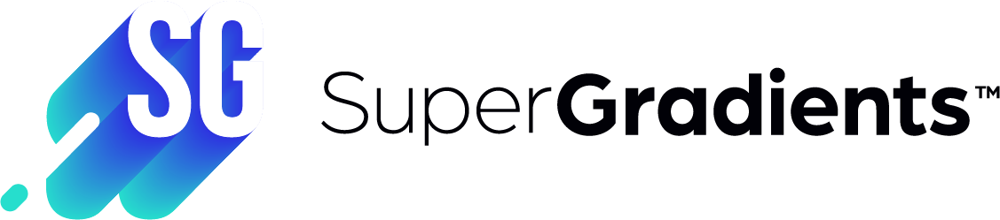

# Object Detection Transfer Learning with SuperGradients

In the following tutorial, we will demonstrate how to use one of SuperGradients pre-trained models and a custom dataset to improve the model's
accuracy using transfer learning for object detection.

Transfer Learning from a pre-trained checkpoint on your own dataset could prove to be very effective instead of deploying the pre-trained model directly on your data or training a model from scratch.
For more information on Transfer Learning, please visit: https://cs231n.github.io/transfer-learning/

In the following example, transfer learning will be used from a COCO2017-pretrained YoloV5Nano model to a custom dataset - a subset of the Pascal VOC 2012 and Pascal VOC 2007 datasets which only has "person" class images and labels.
This Dataset will be named "Person Detection Dataset" just for the example.
Using SuperGradients's dataset sub-classing feature will allow you to generate a partial sub-dataset that has only images and labels covering the desired class(es)

An example real-world use-case of the afformentioned scenario is a surveillance system that detects people.


The tutorial will be comprised of the following steps: 

1.   Generating a sub-dataset of the Pascal VOC 2007 and Pascal VOC 2012 datsets for transfer learning.
2.   Creating new anchors that are a better fit for this new dataset.
3.   Loading SuperGradients' pretrained YoloV5nano and adjust its architecture for the new task replacing its anchors and its last detecting layers according to the new number of classes (single "person" class).
4.   Defining training parameters.
5.   Training the model.
6.   Reviewing the ~5% improvement in Average Precision (AP @ 0.5:0.95) over the pre-trained checkpoint. 





First, let's install the latest version of super-gradients:

In [ ]:
! pip install super_gradients gwpy &> /dev/null
! pip install matplotlib==3.1.3 gwpy &> /dev/null

Imports:

In [ ]:
import os

import super_gradients
from super_gradients.training import SgModel
from super_gradients.training.datasets.dataset_interfaces.dataset_interface import PascalVOCUnifiedDetectionDataSetInterface
from super_gradients.training.metrics.detection_metrics import DetectionMetrics
from super_gradients.training.utils.detection_utils import base_detection_collate_fn, Anchors, AnchorGenerator
from super_gradients.training.utils.callbacks import Phase, DetectionVisualizationCallback
from super_gradients.training.models.detection_models.yolov5 import YoloV5PostPredictionCallback

# Generating the sub-classed Person Dataset

"Person Detection Dataset" is actually created using the "class_inclusion_list" parameter which will create a sub-dataset that contains only the images and labels for the classes that are inside the list.

*Feel free to change the sub_classes_list variable and add/change the classes you are interested in to fine-tune the pre-trained checkpoint on.
Please make sure that you are only using a subset of the 20 classes of Pascal VOC detection available here: 
http://host.robots.ox.ac.uk/pascal/VOC/voc2012/#devkit



In [ ]:
sub_classes_list = ['person']

In [ ]:
sub_dataset_params = {"batch_size": 48,
                  "val_batch_size": 48,
                  "train_image_size": 512,
                  "val_image_size": 512,
                  "val_collate_fn": base_detection_collate_fn,
                  "train_collate_fn": base_detection_collate_fn,
                  "train_sample_loading_method": "mosaic",
                  "val_sample_loading_method": "default",
                  "dataset_hyper_param": {
                      "hsv_h": 0.015,  # IMAGE HSV-Hue AUGMENTATION (fraction)
                      "hsv_s": 0.7,  # IMAGE HSV-Saturation AUGMENTATION (fraction)
                      "hsv_v": 0.4,  # IMAGE HSV-Value AUGMENTATION (fraction)
                      "degrees": 0.0,  # IMAGE ROTATION (+/- deg)
                      "translate": 0.1,  # IMAGE TRANSLATION (+/- fraction)
                      "scale": 0.5,  # IMAGE SCALE (+/- gain)
                      "shear": 0.0},  # IMAGE SHEAR (+/- deg)
                  "class_inclusion_list": sub_classes_list,
                  "download": False,
                  "data_root": "/home/data/pascal_unified_coco_format/"
                  }

In [ ]:
# PascalVOCUnifiedDetectionDataSetInterface - a unified DataSetInterface that combines
# images and labels from PASCAL VOC 2007, and PASCAL VOC 2012

# We use cache_labels=True to pre-load the dataset labels to reduce I/O overhead on small files and improve performance  

trainer = SgModel(experiment_name="yolov5n_pascal_finetune", ckpt_root_dir="/home/data/notebook_ckpts/")
dataset_interface = PascalVOCUnifiedDetectionDataSetInterface(dataset_params=sub_dataset_params, cache_labels=True)

In [ ]:
trainer.connect_dataset_interface(dataset_interface, data_loader_num_workers=8)

# Evaluating pre-trained model performance on Person dataset

In [ ]:
# The pretrained_weights argument will load a pre_trained architecture on the provided dataset
trainer.build_model(architecture="yolo_v5n", arch_params={"pretrained_weights": "coco", "num_classes": 80})

In [ ]:
test_metrics_list = [DetectionMetrics(post_prediction_callback=YoloV5PostPredictionCallback(), num_cls=1)]

original_model_validation_results = trainer.test(test_loader=trainer.valid_loader, test_metrics_list=test_metrics_list, metrics_progress_verbose=True)
original_model_ap = original_model_validation_results[2]
print('Original Model\'s AP@0.5:0.95 is ' + f'{100*original_model_ap:.2f}')

# Generating new anchors

Training with relevant anchors is crucial in order to fit our new dataset properly 
and since our pre-trained model has been trained with anchors relevant for the COCO2017 dataset, new anchors need to be generated for our new dataset.
(If you are not familiar with the concept of anchor boxes, for more information see https://blog.roboflow.com/what-is-an-anchor-box/).


Let's start with downloading the data and intializing a dataset interface that will be used for the anchor generation (you only need to instantiate PascalVOCUnifiedDetectionDataSetInterface with parameter "download": True, for the dataset to be downloaded):

*We are using a different DataSetInterface for anchors generation even though we are using the same images and labels since the parameters for the Anchors generation process are different from the ones for training/validation 


In [ ]:
dataset_params_anchors = {"batch_size": 1,
                          "val_batch_size": 1,
                          "train_image_size": 512,
                          "val_image_size": 512,
                          "train_sample_loading_method": "default",
                          "class_inclusion_list": sub_classes_list,
                          "download": False,
                          "data_root": "/home/data/pascal_unified_coco_format/"
                          }
dataset_interface = PascalVOCUnifiedDetectionDataSetInterface(dataset_params=dataset_params_anchors, cache_labels=True)

Moving on to generating the anchors: we run K-means in order to cluster the bounding boxes of our training set  (clusters are plotted in the output cell below).

In [ ]:
# AnchorGenerator first uses Kmeans to cluster the relevant bboxes to create anchors.
# after kmeans, this algorithm iteratively makes minor random changes in the anchors 
# and if a change imporves the anchors-data fit it uses the new anchors.

anchor_generator = AnchorGenerator()
anchors = anchor_generator(dataset=dataset_interface.trainset, thresh=1/2.91)
anchors = Anchors(anchors_list=anchors,
                  strides=[8, 16, 32])

# Preparing our network for fine-tuning

This is where the magic happens - SuperGradients automatically replaces the head when loading a pre-trained model that was trained on a different number of classes than the new dataset that it is connected to.
In this example a new head is assembled that will be used to train object detection on a single class (Person class)

*Both bullets below are either redunant or not very clear. The rest is rather high level, and here some inside calls are explained, a different tone. Also remember to mention that the rest of the weights aren't damaged and stay the same*

*SgModels classes atrr was set to be different from coco's, after loading the pretrained YoloV5 nano, it will call it's replace_head method and change it's Detect layer accordingly. 
Notice we are also passing our newly generated anchors through 'arch_params'.

**We move the net to CPU first since we need to re-load it to the GPU only after some CPU-bound initializations. 

In [ ]:
trainer.net.to('cpu')
trainer.build_model(architecture="yolo_v5n", arch_params={"pretrained_weights": "coco", "anchors": anchors})

# Defining training parameters


In [ ]:
# DEFINE TRAINING PARAMS. SEE DOCS FOR THE FULL LIST.
training_params = {"max_epochs": 50,
                   "lr_mode": "cosine",
                   "initial_lr": 0.0032,
                   "cosine_final_lr_ratio": 0.12,
                   "lr_warmup_epochs": 2,
                   "warmup_bias_lr": 0.05,  # LR TO START FROM DURING WARMUP (DROPS DOWN DURING WARMUP EPOCHS) FOR BIAS.
                   "loss": "yolo_v5_loss",
                   "criterion_params": {"anchors": anchors,
                                        "box_loss_gain": 0.0296, # COEF FOR BOX LOSS COMPONENT
                                        "cls_loss_gain": 0, # COEF FOR CLASSIFICATION
                                        "obj_loss_gain": 0.19264, # OBJECT BCE COEF
                                        "obj_pos_weight": 0.911,  # OBJECT BCE POSITIVE CLASS WEIGHT
                                        "anchor_threshold": 2.91  # RATIO DEFINING THE SIZE RANGE OF AN ANCHOR.
                                        },
                   "optimizer": "SGD",
                   "warmup_momentum": 0.5,
                   "optimizer_params": {"momentum": 0.9,
                                        "weight_decay": 0.0001,
                                        "nesterov": True},
                   "ema": True,
                   "train_metrics_list": [],
                   "valid_metrics_list": [DetectionMetrics(post_prediction_callback=YoloV5PostPredictionCallback(),
                                                           num_cls=len(
                                                               dataset_interface.classes))],
                   "loss_logging_items_names": ["GIoU", "obj", "cls", "Loss"],
                   "metric_to_watch": "mAP@0.50:0.95",
                   "greater_metric_to_watch_is_better": True,
                   "warmup_mode": "yolov5_warmup",
                   "phase_callbacks": [DetectionVisualizationCallback(phase=Phase.VALIDATION_BATCH_END,
                                                                      freq=1,
                                                                      post_prediction_callback=YoloV5PostPredictionCallback(iou=0.45, conf=0.25),
                                                                      classes=dataset_interface.classes,
                                                                      last_img_idx_in_batch=4)]}


*TODO: Point to the images tab for predictions*

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /home/data/notebook_ckpts/ --bind_all

Finally, call train!

In [ ]:
trainer.train(training_params=training_params)

# Evaluating the Fine-Tuned Model on Person Dataset

In [ ]:
test_metrics_list = [DetectionMetrics(post_prediction_callback=YoloV5PostPredictionCallback(),num_cls=1)]

fine_tuned_model_validation_results = trainer.test(test_loader=trainer.valid_loader, test_metrics_list=test_metrics_list, metrics_progress_verbose=True)

In [ ]:
fine_tuned_model_ap = fine_tuned_model_validation_results[6]
fine_tuned_model_ap

# Summary

This tutorial demonstrated how you can easily increase the accuracy of a pre-trained model by using SuperGradients to fine-tune the model on different data.

We did not cover some crucial parts about the inetrnals of this process (Layer Freezing, Learning Rate adjustments, dataset distributions, etc.) 

But a blog post is coming soon...

In [ ]:
ap_05_095_score_improvement = fine_tuned_model_ap - original_model_ap
print('You have improved the model\'s AP@0.5:0.95 score by ' + f'{100*ap_05_095_score_improvement:.2f}' + ' percent')